In [1]:
!pip install monai
!pip install kaggle
!pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 64.7 MB/s eta 0:00:00


In [2]:
from google.colab import files
print("Upload your kaggle.json file:")
uploaded = files.upload()

# Move kaggle.json to correct location
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Upload your kaggle.json file:


Saving kaggle.json to kaggle.json


In [3]:
!kaggle datasets download -d andrewmvd/drive-digital-retinal-images-for-vessel-extraction
!unzip -q drive-digital-retinal-images-for-vessel-extraction.zip -d drive_data

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction
License(s): other
  0% 0.00/28.0M [00:00<?, ?B/s]
100% 28.0M/28.0M [00:00<00:00, 1.21GB/s]


In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import torch
from PIL import Image

from monai.transforms import (
    Compose, LoadImage, EnsureChannelFirst, ScaleIntensity,
    Resize, RandFlip, RandRotate, RandZoom,
    RandGaussianNoise, RandAdjustContrast
)

In [5]:
print("Checking DRIVE dataset structure...")
!ls drive_data/DRIVE/

# Set correct paths
image_dir = "drive_data/DRIVE/training/images"
mask_dir = "drive_data/DRIVE/training/1st_manual"

# Get all image and mask paths
image_paths = sorted(glob(os.path.join(image_dir, "*.tif")))
mask_paths = sorted(glob(os.path.join(mask_dir, "*.gif")))

print(f"\nFound {len(image_paths)} training images and {len(mask_paths)} masks")

if len(image_paths) > 0:
    print(f"Sample image: {os.path.basename(image_paths[0])}")
if len(mask_paths) > 0:
    print(f"Sample mask: {os.path.basename(mask_paths[0])}")

Checking DRIVE dataset structure...
test  training

Found 20 training images and 20 masks
Sample image: 21_training.tif
Sample mask: 21_manual1.gif


In [6]:
base_transforms = Compose([
    LoadImage(image_only=True, reader="PILReader"),
    EnsureChannelFirst(),
    Resize(spatial_size=(512, 512)),  # Resize to 512x512
    ScaleIntensity(minv=0.0, maxv=1.0),  # Normalize to [0, 1]
])

# Augmentation pipeline (for training)
augmentation_transforms = Compose([
    LoadImage(image_only=True, reader="PILReader"),
    EnsureChannelFirst(),
    Resize(spatial_size=(512, 512)),
    ScaleIntensity(minv=0.0, maxv=1.0),
    RandFlip(prob=0.5, spatial_axis=0),  # Horizontal flip
    RandFlip(prob=0.5, spatial_axis=1),  # Vertical flip
    RandRotate(range_x=0.5, prob=0.7, keep_size=True),  # Rotation up to ~28 degrees
    RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5),  # Zoom in/out
    # Custom augmentation 1: Gaussian noise
    RandGaussianNoise(prob=0.3, mean=0.0, std=0.05),
    # Custom augmentation 2: Contrast adjustment
    RandAdjustContrast(prob=0.3, gamma=(0.8, 1.2))
])

In [7]:
def visualize_transforms(image_path, mask_path, idx):
    """Visualize original vs preprocessed vs augmented"""

    # Load original
    img_original = np.array(Image.open(image_path))
    mask_original = np.array(Image.open(mask_path))

    # Apply base transforms
    img_preprocessed = base_transforms(image_path)
    mask_preprocessed = base_transforms(mask_path)

    # Apply augmentation transforms
    img_augmented = augmentation_transforms(image_path)

    # Convert to numpy for visualization
    if isinstance(img_preprocessed, torch.Tensor):
        img_preprocessed = img_preprocessed.numpy()
    if isinstance(mask_preprocessed, torch.Tensor):
        mask_preprocessed = mask_preprocessed.numpy()
    if isinstance(img_augmented, torch.Tensor):
        img_augmented = img_augmented.numpy()

    # Handle channel dimension
    if img_preprocessed.shape[0] == 3:
        img_preprocessed = np.transpose(img_preprocessed, (1, 2, 0))
    if img_augmented.shape[0] == 3:
        img_augmented = np.transpose(img_augmented, (1, 2, 0))

    # Create visualization
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Row 1: Images
    axes[0, 0].imshow(img_original)
    axes[0, 0].set_title(f"Sample {idx+1}: Original Image")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(img_preprocessed)
    axes[0, 1].set_title(f"Sample {idx+1}: Preprocessed")
    axes[0, 1].axis('off')

    axes[0, 2].imshow(img_augmented)
    axes[0, 2].set_title(f"Sample {idx+1}: Augmented")
    axes[0, 2].axis('off')

    # Row 2: Masks
    axes[1, 0].imshow(mask_original, cmap='gray')
    axes[1, 0].set_title("Original Mask")
    axes[1, 0].axis('off')

    axes[1, 1].imshow(mask_preprocessed.squeeze(), cmap='gray')
    axes[1, 1].set_title("Preprocessed Mask")
    axes[1, 1].axis('off')

    # For mask augmentation, we'd apply the same transforms
    mask_aug_transforms = Compose([
        LoadImage(image_only=True, reader="PILReader"),  # Specify PILReader for masks
        EnsureChannelFirst(),
        Resize(spatial_size=(512, 512)),
        ScaleIntensity(minv=0.0, maxv=1.0),
        RandFlip(prob=0.5, spatial_axis=0),
        RandFlip(prob=0.5, spatial_axis=1),
        RandRotate(range_x=0.5, prob=0.7, keep_size=True),
        RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5),
    ])
    mask_augmented = mask_aug_transforms(mask_path)
    if isinstance(mask_augmented, torch.Tensor):
        mask_augmented = mask_augmented.numpy()

    axes[1, 2].imshow(mask_augmented.squeeze(), cmap='gray')
    axes[1, 2].set_title("Augmented Mask")
    axes[1, 2].axis('off')

    plt.tight_layout()
    plt.savefig(f'drive_transforms_sample_{idx+1}.png', dpi=150, bbox_inches='tight')
    plt.show()


Generating visualizations for 3 samples...


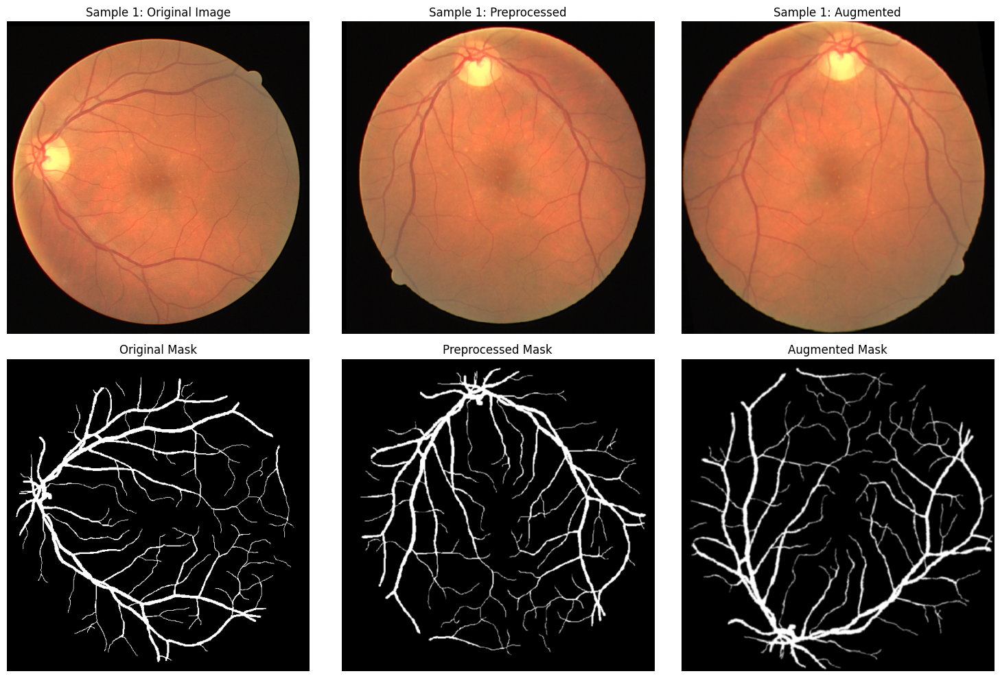

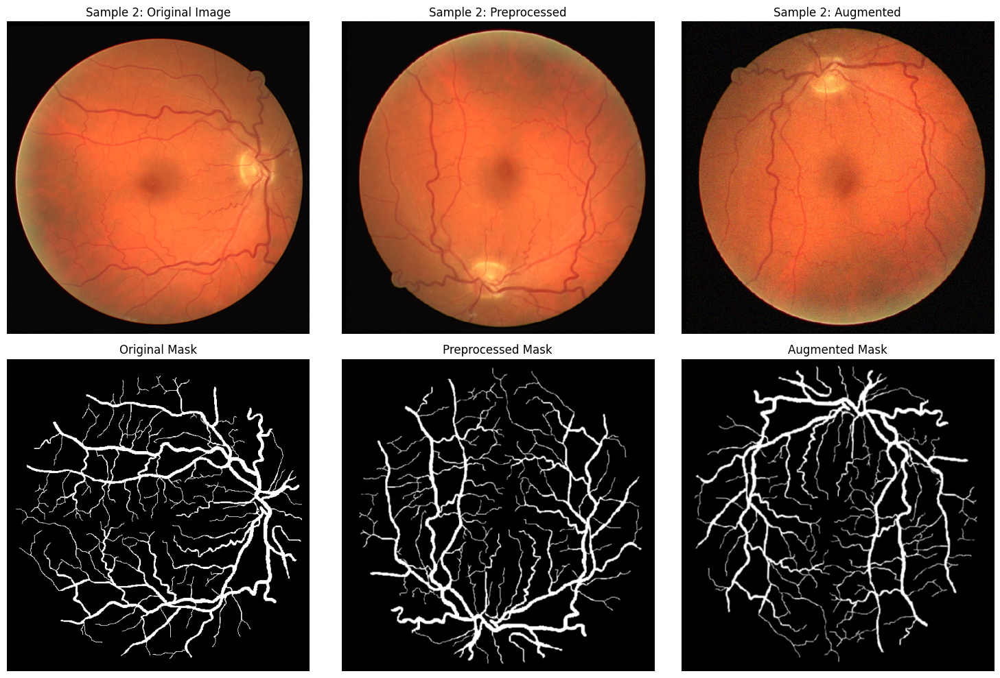

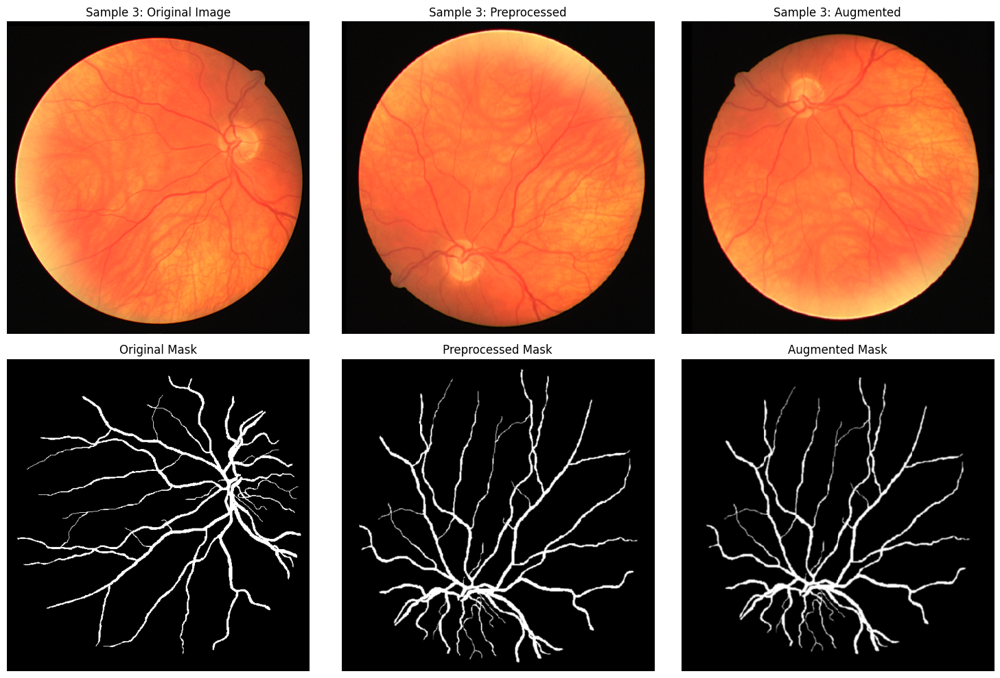

In [8]:
print("\nGenerating visualizations for 3 samples...")
for i in range(3):
    visualize_transforms(image_paths[i], mask_paths[i], i)

In [9]:
!pip install tensorboard

In [10]:
import os
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm

from monai.networks.nets import UNet, AttentionUnet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, ScaleIntensityd,
    Resized, RandFlipd, RandRotated, RandZoomd,
    RandGaussianNoised, RandAdjustContrastd, EnsureTyped
)
from monai.data import Dataset as MonaiDataset, DataLoader as MonaiDataLoader

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")


Using device: cuda
GPU: Tesla T4


In [12]:
image_dir = "drive_data/DRIVE/training/images"
mask_dir = "drive_data/DRIVE/training/1st_manual"

image_paths = sorted(glob(os.path.join(image_dir, "*.tif")))
mask_paths = sorted(glob(os.path.join(mask_dir, "*.gif")))

# Create data dictionaries
data_dicts = [
    {"image": img, "label": mask}
    for img, mask in zip(image_paths, mask_paths)
]

# Split into train and validation (80-20 split)
train_size = int(0.8 * len(data_dicts))
train_data = data_dicts[:train_size]
val_data = data_dicts[train_size:]

print(f"Training samples: {len(train_data)}")
print(f"Validation samples: {len(val_data)}")

Training samples: 16
Validation samples: 4


In [13]:
train_transforms = Compose([
    LoadImaged(keys=["image", "label"], reader="PILReader"),
    EnsureChannelFirstd(keys=["image", "label"]),
    Resized(keys=["image", "label"], spatial_size=(512, 512)),
    ScaleIntensityd(keys=["image", "label"], minv=0.0, maxv=1.0),
    # Augmentations
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=0),
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=1),
    RandRotated(keys=["image", "label"], range_x=0.5, prob=0.7, keep_size=True, mode=["bilinear", "nearest"]),
    RandZoomd(keys=["image", "label"], min_zoom=0.9, max_zoom=1.1, prob=0.5, mode=["area", "nearest"]),
    RandGaussianNoised(keys=["image"], prob=0.3, mean=0.0, std=0.05),
    RandAdjustContrastd(keys=["image"], prob=0.3, gamma=(0.8, 1.2)),
    EnsureTyped(keys=["image", "label"]),
])

val_transforms = Compose([
    LoadImaged(keys=["image", "label"], reader="PILReader"),
    EnsureChannelFirstd(keys=["image", "label"]),
    Resized(keys=["image", "label"], spatial_size=(512, 512)),
    ScaleIntensityd(keys=["image", "label"], minv=0.0, maxv=1.0),
    EnsureTyped(keys=["image", "label"]),
])

In [14]:
train_dataset = MonaiDataset(data=train_data, transform=train_transforms)
val_dataset = MonaiDataset(data=val_data, transform=val_transforms)

train_loader = MonaiDataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
val_loader = MonaiDataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

print(f"\nDataLoaders created successfully!")
print(f"Batches per epoch - Train: {len(train_loader)}, Val: {len(val_loader)}")


DataLoaders created successfully!
Batches per epoch - Train: 4, Val: 1


In [15]:
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler,
                num_epochs=50, model_name="model", patience=10):
    """
    Train the model with early stopping and checkpointing
    """
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses = []
    val_losses = []
    train_dice_scores = []
    val_dice_scores = []

    dice_metric = DiceMetric(include_background=False, reduction="mean")

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        train_dice = 0.0

        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")
        for batch in train_pbar:
            images = batch["image"].to(device)
            labels = batch["label"].to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

            # Calculate Dice score
            with torch.no_grad():
                dice_metric(y_pred=outputs, y=labels)

            train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

        train_loss /= len(train_loader)
        train_dice = dice_metric.aggregate().item()
        dice_metric.reset()

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_dice = 0.0

        with torch.no_grad():
            val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]")
            for batch in val_pbar:
                images = batch["image"].to(device)
                labels = batch["label"].to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                dice_metric(y_pred=outputs, y=labels)
                val_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

        val_loss /= len(val_loader)
        val_dice = dice_metric.aggregate().item()
        dice_metric.reset()

        # Record metrics
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_dice_scores.append(train_dice)
        val_dice_scores.append(val_dice)

        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train Dice: {train_dice:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val Dice: {val_dice:.4f}")

        # Learning rate scheduling
        scheduler.step(val_loss)

        # Early stopping and checkpointing
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # Save best model
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': val_loss,
                'val_dice': val_dice,
            }, f'{model_name}_best.pth')
            print(f"✓ Saved best model (Val Loss: {val_loss:.4f})")
        else:
            patience_counter += 1
            print(f"No improvement. Patience: {patience_counter}/{patience}")

        if patience_counter >= patience:
            print(f"\nEarly stopping triggered after {epoch+1} epochs")
            break

    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_dice': train_dice_scores,
        'val_dice': val_dice_scores
    }


In [16]:
print("\n" + "="*60)
print("TRAINING BASELINE MODEL: 2D UNet")
print("="*60)

baseline_model = UNet(
    spatial_dims=2,
    in_channels=3,  # RGB images
    out_channels=1,  # Binary segmentation
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)

print(f"Baseline Model Parameters: {sum(p.numel() for p in baseline_model.parameters()):,}")

# Loss and optimizer
criterion = DiceLoss(sigmoid=True)
optimizer = Adam(baseline_model.parameters(), lr=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Train baseline model
baseline_history = train_model(
    model=baseline_model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=50,
    model_name="drive_baseline_unet",
    patience=10
)


TRAINING BASELINE MODEL: 2D UNet
Baseline Model Parameters: 1,625,420


Epoch 1/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s, loss=0.8439]



Epoch 1/50
Train Loss: 0.8426, Train Dice: 0.0000
Val Loss: 0.8439, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8439)


Epoch 2/50 [Val]: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it, loss=0.8371]



Epoch 2/50
Train Loss: 0.8340, Train Dice: 0.0000
Val Loss: 0.8371, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8371)


Epoch 3/50 [Val]: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it, loss=0.8328]



Epoch 3/50
Train Loss: 0.8299, Train Dice: 0.0000
Val Loss: 0.8328, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8328)


Epoch 4/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s, loss=0.8294]



Epoch 4/50
Train Loss: 0.8258, Train Dice: 0.0000
Val Loss: 0.8294, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8294)


Epoch 5/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s, loss=0.8262]



Epoch 5/50
Train Loss: 0.8274, Train Dice: 0.0000
Val Loss: 0.8262, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8262)


Epoch 6/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.8228]



Epoch 6/50
Train Loss: 0.8197, Train Dice: 0.0000
Val Loss: 0.8228, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8228)


Epoch 7/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s, loss=0.8193]



Epoch 7/50
Train Loss: 0.8226, Train Dice: 0.0000
Val Loss: 0.8193, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8193)


Epoch 8/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s, loss=0.8159]



Epoch 8/50
Train Loss: 0.8120, Train Dice: 0.0000
Val Loss: 0.8159, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8159)


Epoch 9/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s, loss=0.8125]



Epoch 9/50
Train Loss: 0.8122, Train Dice: 0.0000
Val Loss: 0.8125, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8125)


Epoch 10/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s, loss=0.8091]



Epoch 10/50
Train Loss: 0.8033, Train Dice: 0.0000
Val Loss: 0.8091, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8091)


Epoch 11/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s, loss=0.8052]



Epoch 11/50
Train Loss: 0.8010, Train Dice: 0.0000
Val Loss: 0.8052, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8052)


Epoch 12/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s, loss=0.8019]



Epoch 12/50
Train Loss: 0.8000, Train Dice: 0.0000
Val Loss: 0.8019, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8019)


Epoch 13/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s, loss=0.7982]



Epoch 13/50
Train Loss: 0.8019, Train Dice: 0.0000
Val Loss: 0.7982, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7982)


Epoch 14/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s, loss=0.7953]



Epoch 14/50
Train Loss: 0.7930, Train Dice: 0.0000
Val Loss: 0.7953, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7953)


Epoch 15/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s, loss=0.7926]



Epoch 15/50
Train Loss: 0.7938, Train Dice: 0.0000
Val Loss: 0.7926, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7926)


Epoch 16/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s, loss=0.7900]



Epoch 16/50
Train Loss: 0.7878, Train Dice: 0.0000
Val Loss: 0.7900, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7900)


Epoch 17/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s, loss=0.7884]



Epoch 17/50
Train Loss: 0.7921, Train Dice: 0.0000
Val Loss: 0.7884, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7884)


Epoch 18/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s, loss=0.7863]



Epoch 18/50
Train Loss: 0.7906, Train Dice: 0.0000
Val Loss: 0.7863, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7863)


Epoch 19/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s, loss=0.7842]



Epoch 19/50
Train Loss: 0.7781, Train Dice: 0.0000
Val Loss: 0.7842, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7842)


Epoch 20/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s, loss=0.7820]



Epoch 20/50
Train Loss: 0.7846, Train Dice: 0.0000
Val Loss: 0.7820, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7820)


Epoch 21/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s, loss=0.7805]



Epoch 21/50
Train Loss: 0.7811, Train Dice: 0.0000
Val Loss: 0.7805, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7805)


Epoch 22/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s, loss=0.7791]



Epoch 22/50
Train Loss: 0.7750, Train Dice: 0.0000
Val Loss: 0.7791, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7791)


Epoch 23/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s, loss=0.7777]



Epoch 23/50
Train Loss: 0.7764, Train Dice: 0.0000
Val Loss: 0.7777, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7777)


Epoch 24/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s, loss=0.7765]



Epoch 24/50
Train Loss: 0.7731, Train Dice: 0.0000
Val Loss: 0.7765, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7765)


Epoch 25/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s, loss=0.7753]



Epoch 25/50
Train Loss: 0.7712, Train Dice: 0.0000
Val Loss: 0.7753, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7753)


Epoch 26/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s, loss=0.7742]



Epoch 26/50
Train Loss: 0.7711, Train Dice: 0.0000
Val Loss: 0.7742, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7742)


Epoch 27/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s, loss=0.7731]



Epoch 27/50
Train Loss: 0.7650, Train Dice: 0.0000
Val Loss: 0.7731, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7731)


Epoch 28/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s, loss=0.7719]



Epoch 28/50
Train Loss: 0.7693, Train Dice: 0.0000
Val Loss: 0.7719, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7719)


Epoch 29/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s, loss=0.7708]



Epoch 29/50
Train Loss: 0.7707, Train Dice: 0.0000
Val Loss: 0.7708, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7708)


Epoch 30/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s, loss=0.7700]



Epoch 30/50
Train Loss: 0.7765, Train Dice: 0.0000
Val Loss: 0.7700, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7700)


Epoch 31/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s, loss=0.7692]



Epoch 31/50
Train Loss: 0.7679, Train Dice: 0.0000
Val Loss: 0.7692, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7692)


Epoch 32/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s, loss=0.7682]



Epoch 32/50
Train Loss: 0.7620, Train Dice: 0.0000
Val Loss: 0.7682, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7682)


Epoch 33/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s, loss=0.7676]



Epoch 33/50
Train Loss: 0.7598, Train Dice: 0.0000
Val Loss: 0.7676, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7676)


Epoch 34/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s, loss=0.7670]



Epoch 34/50
Train Loss: 0.7687, Train Dice: 0.0000
Val Loss: 0.7670, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7670)


Epoch 35/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s, loss=0.7659]



Epoch 35/50
Train Loss: 0.7590, Train Dice: 0.0000
Val Loss: 0.7659, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7659)


Epoch 36/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s, loss=0.7652]



Epoch 36/50
Train Loss: 0.7605, Train Dice: 0.0000
Val Loss: 0.7652, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7652)


Epoch 37/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s, loss=0.7649]



Epoch 37/50
Train Loss: 0.7587, Train Dice: 0.0000
Val Loss: 0.7649, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7649)


Epoch 38/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s, loss=0.7641]



Epoch 38/50
Train Loss: 0.7615, Train Dice: 0.0000
Val Loss: 0.7641, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7641)


Epoch 39/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s, loss=0.7628]



Epoch 39/50
Train Loss: 0.7574, Train Dice: 0.0000
Val Loss: 0.7628, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7628)


Epoch 40/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s, loss=0.7624]



Epoch 40/50
Train Loss: 0.7640, Train Dice: 0.0000
Val Loss: 0.7624, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7624)


Epoch 41/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s, loss=0.7615]



Epoch 41/50
Train Loss: 0.7586, Train Dice: 0.0000
Val Loss: 0.7615, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7615)


Epoch 42/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s, loss=0.7608]



Epoch 42/50
Train Loss: 0.7613, Train Dice: 0.0000
Val Loss: 0.7608, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7608)


Epoch 43/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s, loss=0.7605]



Epoch 43/50
Train Loss: 0.7532, Train Dice: 0.0000
Val Loss: 0.7605, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7605)


Epoch 44/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s, loss=0.7597]



Epoch 44/50
Train Loss: 0.7592, Train Dice: 0.0000
Val Loss: 0.7597, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7597)


Epoch 45/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s, loss=0.7588]



Epoch 45/50
Train Loss: 0.7521, Train Dice: 0.0000
Val Loss: 0.7588, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7588)


Epoch 46/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s, loss=0.7583]



Epoch 46/50
Train Loss: 0.7570, Train Dice: 0.0000
Val Loss: 0.7583, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7583)


Epoch 47/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s, loss=0.7583]



Epoch 47/50
Train Loss: 0.7593, Train Dice: 0.0000
Val Loss: 0.7583, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7583)


Epoch 48/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s, loss=0.7580]



Epoch 48/50
Train Loss: 0.7564, Train Dice: 0.0000
Val Loss: 0.7580, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7580)


Epoch 49/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.7570]



Epoch 49/50
Train Loss: 0.7531, Train Dice: 0.0000
Val Loss: 0.7570, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7570)


Epoch 50/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s, loss=0.7573]


Epoch 50/50
Train Loss: 0.7550, Train Dice: 0.0000
Val Loss: 0.7573, Val Dice: 0.0000
No improvement. Patience: 1/10


In [17]:
print("\n" + "="*60)
print("TRAINING ADVANCED MODEL: Attention UNet")
print("="*60)

advanced_model = AttentionUnet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
).to(device)

print(f"Advanced Model Parameters: {sum(p.numel() for p in advanced_model.parameters()):,}")

# Loss and optimizer
optimizer_adv = Adam(advanced_model.parameters(), lr=1e-4)
scheduler_adv = ReduceLROnPlateau(optimizer_adv, mode='min', factor=0.5, patience=5)

# Train advanced model
advanced_history = train_model(
    model=advanced_model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer_adv,
    scheduler=scheduler_adv,
    num_epochs=50,
    model_name="drive_attention_unet",
    patience=10
)


TRAINING ADVANCED MODEL: Attention UNet
Advanced Model Parameters: 1,987,705


Epoch 1/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s, loss=0.8552]



Epoch 1/50
Train Loss: 0.8468, Train Dice: 0.0000
Val Loss: 0.8552, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8552)


Epoch 2/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s, loss=0.8553]



Epoch 2/50
Train Loss: 0.8332, Train Dice: 0.0000
Val Loss: 0.8553, Val Dice: 0.0000
No improvement. Patience: 1/10


Epoch 3/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s, loss=0.8522]



Epoch 3/50
Train Loss: 0.8257, Train Dice: 0.0000
Val Loss: 0.8522, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8522)


Epoch 4/50 [Val]: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it, loss=0.8466]



Epoch 4/50
Train Loss: 0.8186, Train Dice: 0.0000
Val Loss: 0.8466, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8466)


Epoch 5/50 [Val]: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it, loss=0.8479]



Epoch 5/50
Train Loss: 0.8163, Train Dice: 0.0000
Val Loss: 0.8479, Val Dice: 0.0000
No improvement. Patience: 1/10


Epoch 6/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s, loss=0.8354]



Epoch 6/50
Train Loss: 0.8033, Train Dice: 0.0000
Val Loss: 0.8354, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8354)


Epoch 7/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s, loss=0.8268]



Epoch 7/50
Train Loss: 0.7985, Train Dice: 0.0000
Val Loss: 0.8268, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8268)


Epoch 8/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s, loss=0.8226]



Epoch 8/50
Train Loss: 0.7918, Train Dice: 0.0000
Val Loss: 0.8226, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8226)


Epoch 9/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s, loss=0.8054]



Epoch 9/50
Train Loss: 0.7946, Train Dice: 0.0000
Val Loss: 0.8054, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8054)


Epoch 10/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s, loss=0.8026]



Epoch 10/50
Train Loss: 0.7850, Train Dice: 0.0000
Val Loss: 0.8026, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.8026)


Epoch 11/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s, loss=0.7972]



Epoch 11/50
Train Loss: 0.7727, Train Dice: 0.0000
Val Loss: 0.7972, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7972)


Epoch 12/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s, loss=0.7894]



Epoch 12/50
Train Loss: 0.7676, Train Dice: 0.0000
Val Loss: 0.7894, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7894)


Epoch 13/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s, loss=0.7862]



Epoch 13/50
Train Loss: 0.7756, Train Dice: 0.0000
Val Loss: 0.7862, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7862)


Epoch 14/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s, loss=0.7760]



Epoch 14/50
Train Loss: 0.7698, Train Dice: 0.0000
Val Loss: 0.7760, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7760)


Epoch 15/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s, loss=0.7677]



Epoch 15/50
Train Loss: 0.7637, Train Dice: 0.0000
Val Loss: 0.7677, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7677)


Epoch 16/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s, loss=0.7645]



Epoch 16/50
Train Loss: 0.7659, Train Dice: 0.0000
Val Loss: 0.7645, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7645)


Epoch 17/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s, loss=0.7613]



Epoch 17/50
Train Loss: 0.7576, Train Dice: 0.0000
Val Loss: 0.7613, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7613)


Epoch 18/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s, loss=0.7555]



Epoch 18/50
Train Loss: 0.7544, Train Dice: 0.0000
Val Loss: 0.7555, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7555)


Epoch 19/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.7529]



Epoch 19/50
Train Loss: 0.7513, Train Dice: 0.0000
Val Loss: 0.7529, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7529)


Epoch 20/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s, loss=0.7505]



Epoch 20/50
Train Loss: 0.7573, Train Dice: 0.0000
Val Loss: 0.7505, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7505)


Epoch 21/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s, loss=0.7457]



Epoch 21/50
Train Loss: 0.7376, Train Dice: 0.0000
Val Loss: 0.7457, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7457)


Epoch 22/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s, loss=0.7437]



Epoch 22/50
Train Loss: 0.7503, Train Dice: 0.0000
Val Loss: 0.7437, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7437)


Epoch 23/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s, loss=0.7427]



Epoch 23/50
Train Loss: 0.7458, Train Dice: 0.0000
Val Loss: 0.7427, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7427)


Epoch 24/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s, loss=0.7402]



Epoch 24/50
Train Loss: 0.7423, Train Dice: 0.0000
Val Loss: 0.7402, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7402)


Epoch 25/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s, loss=0.7392]



Epoch 25/50
Train Loss: 0.7347, Train Dice: 0.0000
Val Loss: 0.7392, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7392)


Epoch 26/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s, loss=0.7386]



Epoch 26/50
Train Loss: 0.7299, Train Dice: 0.0000
Val Loss: 0.7386, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7386)


Epoch 27/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s, loss=0.7375]



Epoch 27/50
Train Loss: 0.7353, Train Dice: 0.0000
Val Loss: 0.7375, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7375)


Epoch 28/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s, loss=0.7362]



Epoch 28/50
Train Loss: 0.7440, Train Dice: 0.0000
Val Loss: 0.7362, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7362)


Epoch 29/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s, loss=0.7350]



Epoch 29/50
Train Loss: 0.7312, Train Dice: 0.0000
Val Loss: 0.7350, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7350)


Epoch 30/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s, loss=0.7344]



Epoch 30/50
Train Loss: 0.7280, Train Dice: 0.0000
Val Loss: 0.7344, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7344)


Epoch 31/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s, loss=0.7332]



Epoch 31/50
Train Loss: 0.7313, Train Dice: 0.0000
Val Loss: 0.7332, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7332)


Epoch 32/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s, loss=0.7325]



Epoch 32/50
Train Loss: 0.7358, Train Dice: 0.0000
Val Loss: 0.7325, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7325)


Epoch 33/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s, loss=0.7314]



Epoch 33/50
Train Loss: 0.7310, Train Dice: 0.0000
Val Loss: 0.7314, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7314)


Epoch 34/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s, loss=0.7308]



Epoch 34/50
Train Loss: 0.7386, Train Dice: 0.0000
Val Loss: 0.7308, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7308)


Epoch 35/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s, loss=0.7306]



Epoch 35/50
Train Loss: 0.7312, Train Dice: 0.0000
Val Loss: 0.7306, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7306)


Epoch 36/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s, loss=0.7292]



Epoch 36/50
Train Loss: 0.7326, Train Dice: 0.0000
Val Loss: 0.7292, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7292)


Epoch 37/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s, loss=0.7282]



Epoch 37/50
Train Loss: 0.7267, Train Dice: 0.0000
Val Loss: 0.7282, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7282)


Epoch 38/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s, loss=0.7276]



Epoch 38/50
Train Loss: 0.7286, Train Dice: 0.0000
Val Loss: 0.7276, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7276)


Epoch 39/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s, loss=0.7268]



Epoch 39/50
Train Loss: 0.7269, Train Dice: 0.0000
Val Loss: 0.7268, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7268)


Epoch 40/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s, loss=0.7265]



Epoch 40/50
Train Loss: 0.7253, Train Dice: 0.0000
Val Loss: 0.7265, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7265)


Epoch 41/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s, loss=0.7263]



Epoch 41/50
Train Loss: 0.7287, Train Dice: 0.0000
Val Loss: 0.7263, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7263)


Epoch 42/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s, loss=0.7264]



Epoch 42/50
Train Loss: 0.7271, Train Dice: 0.0000
Val Loss: 0.7264, Val Dice: 0.0000
No improvement. Patience: 1/10


Epoch 43/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s, loss=0.7256]



Epoch 43/50
Train Loss: 0.7198, Train Dice: 0.0000
Val Loss: 0.7256, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7256)


Epoch 44/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s, loss=0.7249]



Epoch 44/50
Train Loss: 0.7306, Train Dice: 0.0000
Val Loss: 0.7249, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7249)


Epoch 45/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s, loss=0.7242]



Epoch 45/50
Train Loss: 0.7167, Train Dice: 0.0000
Val Loss: 0.7242, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7242)


Epoch 46/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s, loss=0.7236]



Epoch 46/50
Train Loss: 0.7254, Train Dice: 0.0000
Val Loss: 0.7236, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7236)


Epoch 47/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s, loss=0.7234]



Epoch 47/50
Train Loss: 0.7217, Train Dice: 0.0000
Val Loss: 0.7234, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7234)


Epoch 48/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s, loss=0.7223]



Epoch 48/50
Train Loss: 0.7268, Train Dice: 0.0000
Val Loss: 0.7223, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7223)


Epoch 49/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s, loss=0.7215]



Epoch 49/50
Train Loss: 0.7238, Train Dice: 0.0000
Val Loss: 0.7215, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7215)


Epoch 50/50 [Val]: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s, loss=0.7209]


Epoch 50/50
Train Loss: 0.7167, Train Dice: 0.0000
Val Loss: 0.7209, Val Dice: 0.0000
✓ Saved best model (Val Loss: 0.7209)


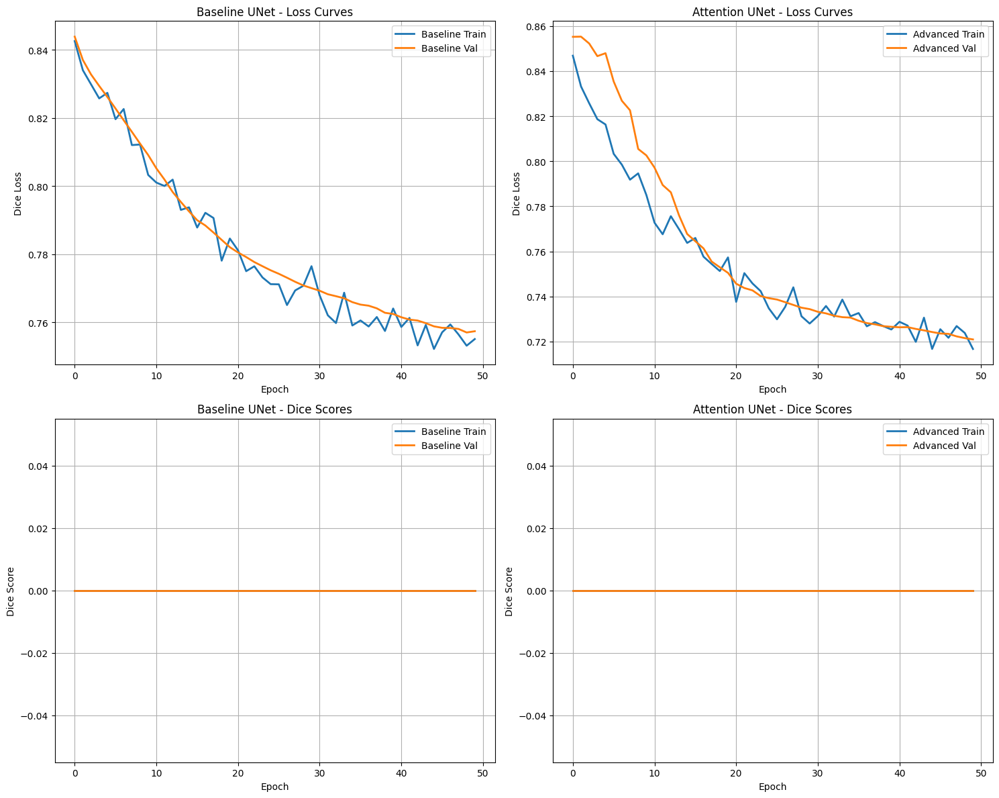

In [18]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Loss curves
axes[0, 0].plot(baseline_history['train_losses'], label='Baseline Train', linewidth=2)
axes[0, 0].plot(baseline_history['val_losses'], label='Baseline Val', linewidth=2)
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Dice Loss')
axes[0, 0].set_title('Baseline UNet - Loss Curves')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(advanced_history['train_losses'], label='Advanced Train', linewidth=2)
axes[0, 1].plot(advanced_history['val_losses'], label='Advanced Val', linewidth=2)
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Dice Loss')
axes[0, 1].set_title('Attention UNet - Loss Curves')
axes[0, 1].legend()
axes[0, 1].grid(True)

# Dice score curves
axes[1, 0].plot(baseline_history['train_dice'], label='Baseline Train', linewidth=2)
axes[1, 0].plot(baseline_history['val_dice'], label='Baseline Val', linewidth=2)
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Dice Score')
axes[1, 0].set_title('Baseline UNet - Dice Scores')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(advanced_history['train_dice'], label='Advanced Train', linewidth=2)
axes[1, 1].plot(advanced_history['val_dice'], label='Advanced Val', linewidth=2)
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Dice Score')
axes[1, 1].set_title('Attention UNet - Dice Scores')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.savefig('drive_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

In [19]:
!pip install scikit-image opencv-python

In [20]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
import cv2
from scipy import ndimage
from skimage import morphology, measure
from tqdm import tqdm

from monai.networks.nets import UNet, AttentionUnet
from monai.transforms import Compose, LoadImage, EnsureChannelFirst, Resize, ScaleIntensity
from monai.inferers import sliding_window_inference
from monai.metrics import DiceMetric

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define model architectures (same as training)
baseline_model = UNet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)

advanced_model = AttentionUnet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
).to(device)

# Load trained weights
print("\nLoading trained model weights...")
baseline_checkpoint = torch.load('drive_baseline_unet_best.pth', map_location=device)
baseline_model.load_state_dict(baseline_checkpoint['model_state_dict'])
baseline_model.eval()
print(f"✓ Baseline model loaded (Val Dice: {baseline_checkpoint['val_dice']:.4f})")

advanced_checkpoint = torch.load('drive_attention_unet_best.pth', map_location=device)
advanced_model.load_state_dict(advanced_checkpoint['model_state_dict'])
advanced_model.eval()
print(f"✓ Advanced model loaded (Val Dice: {advanced_checkpoint['val_dice']:.4f})")

Using device: cuda

Loading trained model weights...
✓ Baseline model loaded (Val Dice: 0.0000)
✓ Advanced model loaded (Val Dice: 0.0000)


In [22]:
image_dir = "drive_data/DRIVE/training/images"
mask_dir = "drive_data/DRIVE/training/1st_manual"

image_paths = sorted(glob(os.path.join(image_dir, "*.tif")))
mask_paths = sorted(glob(os.path.join(mask_dir, "*.gif")))

# Use last 4 images as test (same as validation split in Task 2)
train_size = int(0.8 * len(image_paths))
test_image_paths = image_paths[train_size:]
test_mask_paths = mask_paths[train_size:]

print(f"\nTest samples: {len(test_image_paths)}")


Test samples: 4


In [23]:
inference_transforms = Compose([
    LoadImage(image_only=True, reader="PILReader"),
    EnsureChannelFirst(),
    Resize(spatial_size=(512, 512)),
    ScaleIntensity(minv=0.0, maxv=1.0),
])

In [24]:
def apply_morphological_closing(prediction, kernel_size=3):
    """
    Apply morphological closing to fill small holes
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed = cv2.morphologyEx(prediction.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    return closed

def remove_small_components(prediction, min_size=50):
    """
    Remove small connected components (noise removal)
    """
    # Label connected components
    labeled = measure.label(prediction, connectivity=2)
    # Remove small objects
    cleaned = morphology.remove_small_objects(labeled, min_size=min_size)
    return (cleaned > 0).astype(np.uint8)

def apply_skeleton_thinning(prediction):
    """
    Apply morphological thinning to get vessel centerlines
    """
    skeleton = morphology.skeletonize(prediction > 0)
    return skeleton.astype(np.uint8)

def post_process_prediction(pred_binary, method='closing'):
    """
    Apply specified post-processing method
    """
    if method == 'closing':
        return apply_morphological_closing(pred_binary, kernel_size=3)
    elif method == 'remove_small':
        return remove_small_components(pred_binary, min_size=50)
    elif method == 'thinning':
        return apply_skeleton_thinning(pred_binary)
    elif method == 'combined':
        # Apply closing first, then remove small components
        closed = apply_morphological_closing(pred_binary, kernel_size=3)
        cleaned = remove_small_components(closed, min_size=50)
        return cleaned
    else:
        return pred_binary

In [25]:
def batch_inference(model, image_paths, threshold=0.5):
    """
    Perform batch inference on multiple images
    """
    predictions = []

    with torch.no_grad():
        for img_path in tqdm(image_paths, desc="Running inference"):
            # Preprocess image
            img_tensor = inference_transforms(img_path)
            img_tensor = img_tensor.unsqueeze(0).to(device)  # Add batch dimension

            # Run inference
            output = model(img_tensor)

            # Apply sigmoid and threshold
            pred = torch.sigmoid(output).cpu().numpy()[0, 0]
            pred_binary = (pred > threshold).astype(np.uint8)

            predictions.append(pred_binary)

    return predictions

In [26]:
print("\n" + "="*60)
print("RUNNING INFERENCE")
print("="*60)

print("\nBaseline Model Inference...")
baseline_preds = batch_inference(baseline_model, test_image_paths)

print("Advanced Model Inference...")
advanced_preds = batch_inference(advanced_model, test_image_paths)



RUNNING INFERENCE

Baseline Model Inference...


Running inference: 100%|██████████| 4/4 [00:00<00:00, 10.47it/s]


Advanced Model Inference...


Running inference: 100%|██████████| 4/4 [00:00<00:00, 10.04it/s]


In [27]:
print("\nApplying post-processing...")
baseline_preds_post = [post_process_prediction(pred, method='combined') for pred in baseline_preds]
advanced_preds_post = [post_process_prediction(pred, method='combined') for pred in advanced_preds]



Applying post-processing...


In [28]:
def calculate_dice(pred, gt):
    """Calculate Dice score"""
    pred_flat = pred.flatten()
    gt_flat = gt.flatten()
    intersection = np.sum(pred_flat * gt_flat)
    return (2.0 * intersection) / (np.sum(pred_flat) + np.sum(gt_flat) + 1e-8)

print("\n" + "="*60)
print("METRICS: Before vs After Post-Processing")
print("="*60)

# Load ground truth masks
gt_masks = []
for mask_path in test_mask_paths:
    mask = np.array(Image.open(mask_path).resize((512, 512)))
    mask = (mask > 0).astype(np.uint8)
    gt_masks.append(mask)

# Calculate metrics
baseline_dice_before = [calculate_dice(pred, gt) for pred, gt in zip(baseline_preds, gt_masks)]
baseline_dice_after = [calculate_dice(pred, gt) for pred, gt in zip(baseline_preds_post, gt_masks)]

advanced_dice_before = [calculate_dice(pred, gt) for pred, gt in zip(advanced_preds, gt_masks)]
advanced_dice_after = [calculate_dice(pred, gt) for pred, gt in zip(advanced_preds_post, gt_masks)]

print("\nBaseline UNet:")
print(f"  Before post-processing: {np.mean(baseline_dice_before):.4f} ± {np.std(baseline_dice_before):.4f}")
print(f"  After post-processing:  {np.mean(baseline_dice_after):.4f} ± {np.std(baseline_dice_after):.4f}")
print(f"  Improvement: {np.mean(baseline_dice_after) - np.mean(baseline_dice_before):.4f}")

print("\nAttention UNet:")
print(f"  Before post-processing: {np.mean(advanced_dice_before):.4f} ± {np.std(advanced_dice_before):.4f}")
print(f"  After post-processing:  {np.mean(advanced_dice_after):.4f} ± {np.std(advanced_dice_after):.4f}")
print(f"  Improvement: {np.mean(advanced_dice_after) - np.mean(advanced_dice_before):.4f}")


METRICS: Before vs After Post-Processing

Baseline UNet:
  Before post-processing: 0.2614 ± 0.0163
  After post-processing:  0.2629 ± 0.0157
  Improvement: 0.0015

Attention UNet:
  Before post-processing: 0.2577 ± 0.0207
  After post-processing:  0.2571 ± 0.0210
  Improvement: -0.0006



GENERATING VISUALIZATIONS

Visualizing sample 1/3...


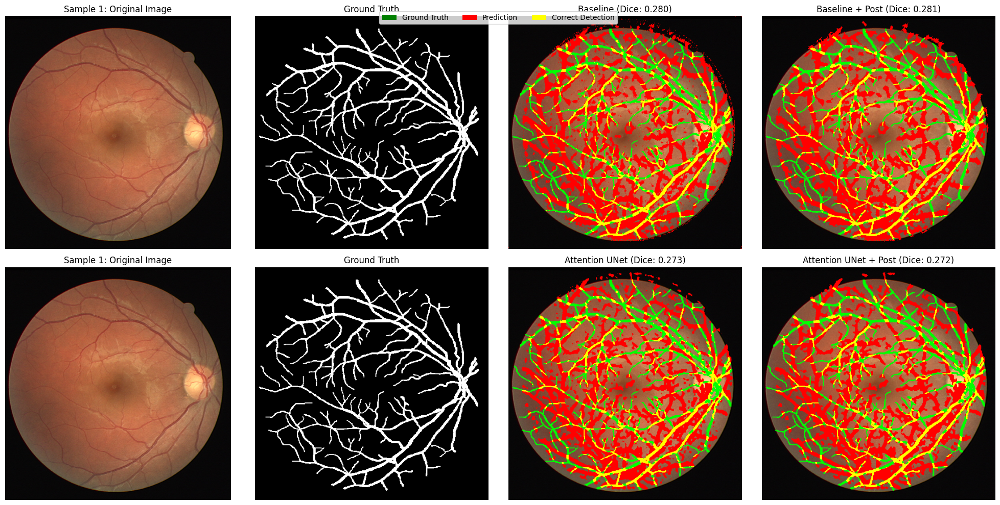


Visualizing sample 2/3...


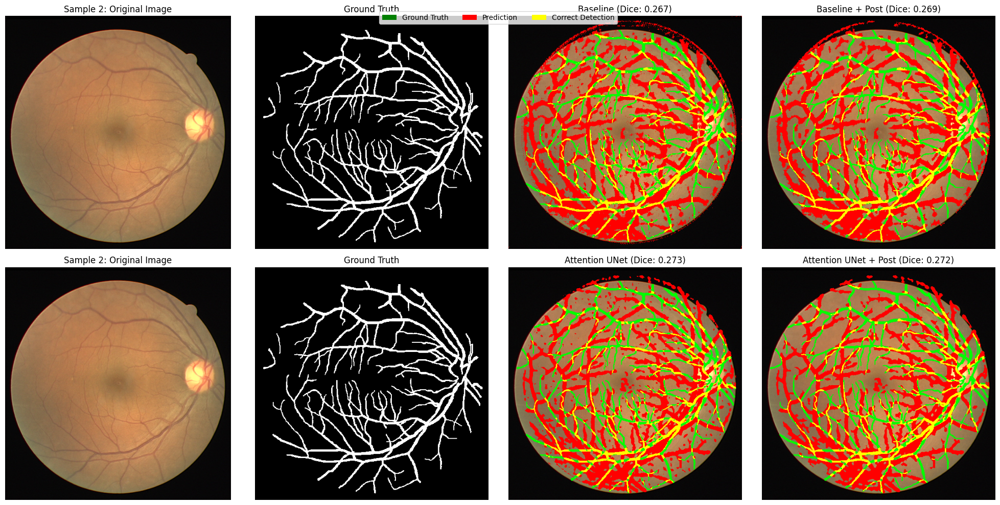


Visualizing sample 3/3...


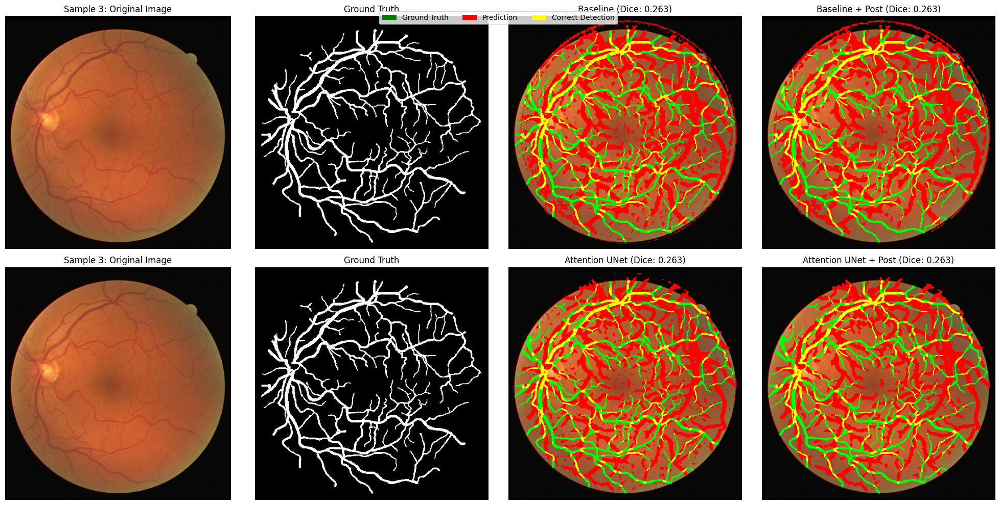

In [29]:
def visualize_predictions(idx, img_path, gt_mask, baseline_pred, baseline_pred_post,
                         advanced_pred, advanced_pred_post):
    """
    Create comprehensive visualization comparing all predictions
    """
    # Load original image
    img_original = np.array(Image.open(img_path))
    # Resize original image to match mask dimensions
    img_original_resized = np.array(Image.open(img_path).resize((512, 512)))


    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    # Row 1: Baseline Model
    axes[0, 0].imshow(img_original)
    axes[0, 0].set_title(f"Sample {idx+1}: Original Image")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(gt_mask, cmap='gray')
    axes[0, 1].set_title("Ground Truth")
    axes[0, 1].axis('off')

    # Overlay: Ground truth (green) vs Baseline prediction (red)
    overlay1 = img_original_resized.copy()
    overlay1[baseline_pred > 0] = [255, 0, 0]  # Red for prediction
    overlay1[gt_mask > 0] = [0, 255, 0]  # Green for ground truth
    overlay1[(baseline_pred > 0) & (gt_mask > 0)] = [255, 255, 0]  # Yellow for overlap
    axes[0, 2].imshow(overlay1)
    axes[0, 2].set_title(f"Baseline (Dice: {calculate_dice(baseline_pred, gt_mask):.3f})")
    axes[0, 2].axis('off')

    # Overlay: After post-processing
    overlay2 = img_original_resized.copy()
    overlay2[baseline_pred_post > 0] = [255, 0, 0]
    overlay2[gt_mask > 0] = [0, 255, 0]
    overlay2[(baseline_pred_post > 0) & (gt_mask > 0)] = [255, 255, 0]
    axes[0, 3].imshow(overlay2)
    axes[0, 3].set_title(f"Baseline + Post (Dice: {calculate_dice(baseline_pred_post, gt_mask):.3f})")
    axes[0, 3].axis('off')

    # Row 2: Advanced Model
    axes[1, 0].imshow(img_original)
    axes[1, 0].set_title(f"Sample {idx+1}: Original Image")
    axes[1, 0].axis('off')

    axes[1, 1].imshow(gt_mask, cmap='gray')
    axes[1, 1].set_title("Ground Truth")
    axes[1, 1].axis('off')

    # Overlay: Ground truth vs Advanced prediction
    overlay3 = img_original_resized.copy()
    overlay3[advanced_pred > 0] = [255, 0, 0]
    overlay3[gt_mask > 0] = [0, 255, 0]
    overlay3[(advanced_pred > 0) & (gt_mask > 0)] = [255, 255, 0]
    axes[1, 2].imshow(overlay3)
    axes[1, 2].set_title(f"Attention UNet (Dice: {calculate_dice(advanced_pred, gt_mask):.3f})")
    axes[1, 2].axis('off')

    # Overlay: After post-processing
    overlay4 = img_original_resized.copy()
    overlay4[advanced_pred_post > 0] = [255, 0, 0]
    overlay4[gt_mask > 0] = [0, 255, 0]
    overlay4[(advanced_pred_post > 0) & (gt_mask > 0)] = [255, 255, 0]
    axes[1, 3].imshow(overlay4)
    axes[1, 3].set_title(f"Attention UNet + Post (Dice: {calculate_dice(advanced_pred_post, gt_mask):.3f})")
    axes[1, 3].axis('off')

    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='green', label='Ground Truth'),
        Patch(facecolor='red', label='Prediction'),
        Patch(facecolor='yellow', label='Correct Detection')
    ]
    fig.legend(handles=legend_elements, loc='upper center', ncol=3, bbox_to_anchor=(0.5, 0.98))

    plt.tight_layout()
    plt.savefig(f'drive_inference_sample_{idx+1}.png', dpi=150, bbox_inches='tight')
    plt.show()

# Visualize 3 samples
print("\n" + "="*60)
print("GENERATING VISUALIZATIONS")
print("="*60)

num_samples = min(3, len(test_image_paths))
for i in range(num_samples):
    print(f"\nVisualizing sample {i+1}/{num_samples}...")
    visualize_predictions(
        i,
        test_image_paths[i],
        gt_masks[i],
        baseline_preds[i],
        baseline_preds_post[i],
        advanced_preds[i],
        advanced_preds_post[i]
    )

In [30]:
!pip install scikit-learn pandas tabulate

In [31]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm import tqdm
import pandas as pd
from sklearn.metrics import (
    roc_curve, auc, precision_recall_curve, average_precision_score,
    confusion_matrix, f1_score, precision_score, recall_score
)

from monai.networks.nets import UNet, AttentionUnet
from monai.transforms import Compose, LoadImage, EnsureChannelFirst, Resize, ScaleIntensity

In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define model architectures
baseline_model = UNet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)

advanced_model = AttentionUnet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
).to(device)

# Load trained weights
print("\nLoading trained model weights...")
baseline_checkpoint = torch.load('drive_baseline_unet_best.pth', map_location=device)
baseline_model.load_state_dict(baseline_checkpoint['model_state_dict'])
baseline_model.eval()

advanced_checkpoint = torch.load('drive_attention_unet_best.pth', map_location=device)
advanced_model.load_state_dict(advanced_checkpoint['model_state_dict'])
advanced_model.eval()

print("✓ Models loaded successfully")

Using device: cuda

Loading trained model weights...
✓ Models loaded successfully


In [33]:
image_dir = "drive_data/DRIVE/training/images"
mask_dir = "drive_data/DRIVE/training/1st_manual"

image_paths = sorted(glob(os.path.join(image_dir, "*.tif")))
mask_paths = sorted(glob(os.path.join(mask_dir, "*.gif")))

# Use validation split
train_size = int(0.8 * len(image_paths))
test_image_paths = image_paths[train_size:]
test_mask_paths = mask_paths[train_size:]

print(f"\nTest samples: {len(test_image_paths)}")


Test samples: 4


In [34]:
inference_transforms = Compose([
    LoadImage(image_only=True, reader="PILReader"),
    EnsureChannelFirst(),
    Resize(spatial_size=(512, 512)),
    ScaleIntensity(minv=0.0, maxv=1.0),
])

In [35]:
def get_probability_maps(model, image_paths):
    """
    Get continuous probability maps (not binary predictions)
    """
    prob_maps = []

    with torch.no_grad():
        for img_path in tqdm(image_paths, desc="Getting probability maps"):
            # Preprocess image
            img_tensor = inference_transforms(img_path)
            img_tensor = img_tensor.unsqueeze(0).to(device)

            # Run inference
            output = model(img_tensor)

            # Apply sigmoid to get probabilities
            prob = torch.sigmoid(output).cpu().numpy()[0, 0]
            prob_maps.append(prob)

    return prob_maps

In [36]:
print("\n" + "="*60)
print("GENERATING PROBABILITY MAPS")
print("="*60)

print("\nBaseline Model...")
baseline_probs = get_probability_maps(baseline_model, test_image_paths)

print("Advanced Model...")
advanced_probs = get_probability_maps(advanced_model, test_image_paths)


GENERATING PROBABILITY MAPS

Baseline Model...


Getting probability maps: 100%|██████████| 4/4 [00:00<00:00, 11.42it/s]


Advanced Model...


Getting probability maps: 100%|██████████| 4/4 [00:00<00:00, 11.49it/s]


In [37]:
gt_masks = []
for mask_path in test_mask_paths:
    mask = np.array(Image.open(mask_path).resize((512, 512)))
    mask = (mask > 0).astype(np.uint8)
    gt_masks.append(mask)

In [38]:
baseline_probs_flat = np.concatenate([prob.flatten() for prob in baseline_probs])
advanced_probs_flat = np.concatenate([prob.flatten() for prob in advanced_probs])
gt_flat = np.concatenate([mask.flatten() for mask in gt_masks])

print(f"\nTotal pixels evaluated: {len(gt_flat):,}")
print(f"Positive pixels (vessels): {np.sum(gt_flat):,} ({100*np.sum(gt_flat)/len(gt_flat):.2f}%)")



Total pixels evaluated: 1,048,576
Positive pixels (vessels): 126,292 (12.04%)


In [39]:
def calculate_metrics_at_threshold(prob_map, gt_mask, threshold=0.5):
    """
    Calculate metrics at a specific threshold
    """
    pred_binary = (prob_map > threshold).astype(np.uint8)

    # Flatten
    pred_flat = pred_binary.flatten()
    gt_flat = gt_mask.flatten()

    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(gt_flat, pred_flat).ravel()

    # Calculate metrics
    dice = (2.0 * tp) / (2 * tp + fp + fn + 1e-8)
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)  # Same as sensitivity
    specificity = tn / (tn + fp + 1e-8)
    f1 = f1_score(gt_flat, pred_flat, zero_division=0)

    return {
        'dice': dice,
        'precision': precision,
        'recall': recall,
        'sensitivity': recall,
        'specificity': specificity,
        'f1': f1
    }

# Calculate metrics for both models at threshold 0.5
print("\n" + "="*60)
print("DETAILED METRICS AT THRESHOLD 0.5")
print("="*60)

baseline_metrics = []
advanced_metrics = []

for prob, gt in zip(baseline_probs, gt_masks):
    metrics = calculate_metrics_at_threshold(prob, gt, threshold=0.5)
    baseline_metrics.append(metrics)

for prob, gt in zip(advanced_probs, gt_masks):
    metrics = calculate_metrics_at_threshold(prob, gt, threshold=0.5)
    advanced_metrics.append(metrics)

# Average metrics across all test samples
baseline_avg = {key: np.mean([m[key] for m in baseline_metrics]) for key in baseline_metrics[0].keys()}
advanced_avg = {key: np.mean([m[key] for m in advanced_metrics]) for key in advanced_metrics[0].keys()}

# Step 11: Calculate ROC-AUC
print("\nCalculating ROC curves...")
baseline_fpr, baseline_tpr, _ = roc_curve(gt_flat, baseline_probs_flat)
baseline_roc_auc = auc(baseline_fpr, baseline_tpr)

advanced_fpr, advanced_tpr, _ = roc_curve(gt_flat, advanced_probs_flat)
advanced_roc_auc = auc(advanced_fpr, advanced_tpr)


DETAILED METRICS AT THRESHOLD 0.5

Calculating ROC curves...


In [40]:
print("Calculating PR curves...")
baseline_precision, baseline_recall, _ = precision_recall_curve(gt_flat, baseline_probs_flat)
baseline_pr_auc = average_precision_score(gt_flat, baseline_probs_flat)

advanced_precision, advanced_recall, _ = precision_recall_curve(gt_flat, advanced_probs_flat)
advanced_pr_auc = average_precision_score(gt_flat, advanced_probs_flat)

Calculating PR curves...


In [41]:
print("\n" + "="*60)
print("COMPREHENSIVE METRICS COMPARISON")
print("="*60)

metrics_data = {
    'Metric': ['Dice Score', 'Precision', 'Recall', 'F1-Score',
               'Sensitivity', 'Specificity', 'ROC-AUC', 'PR-AUC'],
    'Baseline UNet': [
        f"{baseline_avg['dice']:.4f}",
        f"{baseline_avg['precision']:.4f}",
        f"{baseline_avg['recall']:.4f}",
        f"{baseline_avg['f1']:.4f}",
        f"{baseline_avg['sensitivity']:.4f}",
        f"{baseline_avg['specificity']:.4f}",
        f"{baseline_roc_auc:.4f}",
        f"{baseline_pr_auc:.4f}"
    ],
    'Attention UNet': [
        f"{advanced_avg['dice']:.4f}",
        f"{advanced_avg['precision']:.4f}",
        f"{advanced_avg['recall']:.4f}",
        f"{advanced_avg['f1']:.4f}",
        f"{advanced_avg['sensitivity']:.4f}",
        f"{advanced_avg['specificity']:.4f}",
        f"{advanced_roc_auc:.4f}",
        f"{advanced_pr_auc:.4f}"
    ],
    'Difference': [
        f"{advanced_avg['dice'] - baseline_avg['dice']:+.4f}",
        f"{advanced_avg['precision'] - baseline_avg['precision']:+.4f}",
        f"{advanced_avg['recall'] - baseline_avg['recall']:+.4f}",
        f"{advanced_avg['f1'] - baseline_avg['f1']:+.4f}",
        f"{advanced_avg['sensitivity'] - baseline_avg['sensitivity']:+.4f}",
        f"{advanced_avg['specificity'] - baseline_avg['specificity']:+.4f}",
        f"{advanced_roc_auc - baseline_roc_auc:+.4f}",
        f"{advanced_pr_auc - baseline_pr_auc:+.4f}"
    ]
}

df_metrics = pd.DataFrame(metrics_data)
print("\n" + df_metrics.to_string(index=False))

# Save metrics table
df_metrics.to_csv('drive_metrics_comparison.csv', index=False)
print("\n✓ Metrics table saved to 'drive_metrics_comparison.csv'")



COMPREHENSIVE METRICS COMPARISON

     Metric Baseline UNet Attention UNet Difference
 Dice Score        0.2614         0.2577    -0.0037
  Precision        0.1868         0.1904    +0.0036
     Recall        0.4359         0.3990    -0.0369
   F1-Score        0.2614         0.2577    -0.0037
Sensitivity        0.4359         0.3990    -0.0369
Specificity        0.7401         0.7676    +0.0276
    ROC-AUC        0.6092         0.6807    +0.0715
     PR-AUC        0.1791         0.1881    +0.0090

✓ Metrics table saved to 'drive_metrics_comparison.csv'


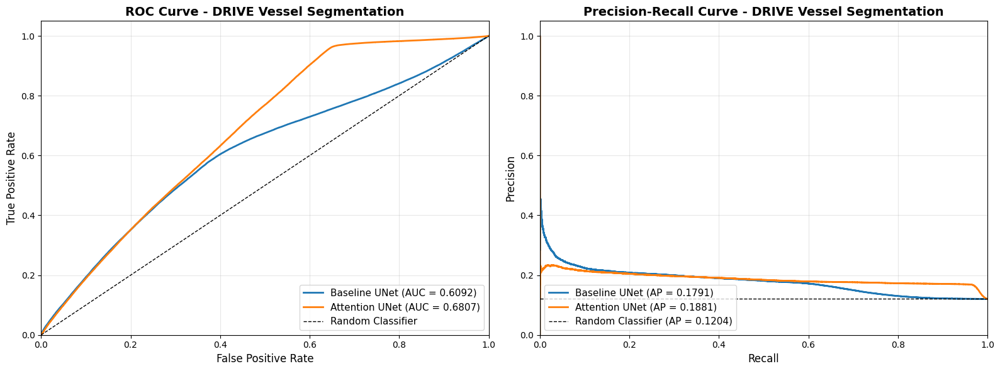

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ROC Curve
axes[0].plot(baseline_fpr, baseline_tpr, linewidth=2,
             label=f'Baseline UNet (AUC = {baseline_roc_auc:.4f})')
axes[0].plot(advanced_fpr, advanced_tpr, linewidth=2,
             label=f'Attention UNet (AUC = {advanced_roc_auc:.4f})')
axes[0].plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Classifier')
axes[0].set_xlabel('False Positive Rate', fontsize=12)
axes[0].set_ylabel('True Positive Rate', fontsize=12)
axes[0].set_title('ROC Curve - DRIVE Vessel Segmentation', fontsize=14, fontweight='bold')
axes[0].legend(loc='lower right', fontsize=11)
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Precision-Recall Curve
axes[1].plot(baseline_recall, baseline_precision, linewidth=2,
             label=f'Baseline UNet (AP = {baseline_pr_auc:.4f})')
axes[1].plot(advanced_recall, advanced_precision, linewidth=2,
             label=f'Attention UNet (AP = {advanced_pr_auc:.4f})')
# Calculate baseline (random) for PR curve
baseline_line = np.sum(gt_flat) / len(gt_flat)
axes[1].axhline(y=baseline_line, color='k', linestyle='--', linewidth=1,
                label=f'Random Classifier (AP = {baseline_line:.4f})')
axes[1].set_xlabel('Recall', fontsize=12)
axes[1].set_ylabel('Precision', fontsize=12)
axes[1].set_title('Precision-Recall Curve - DRIVE Vessel Segmentation', fontsize=14, fontweight='bold')
axes[1].legend(loc='lower left', fontsize=11)
axes[1].grid(True, alpha=0.3)
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

plt.tight_layout()
plt.savefig('drive_roc_pr_curves.png', dpi=150, bbox_inches='tight')
plt.show()


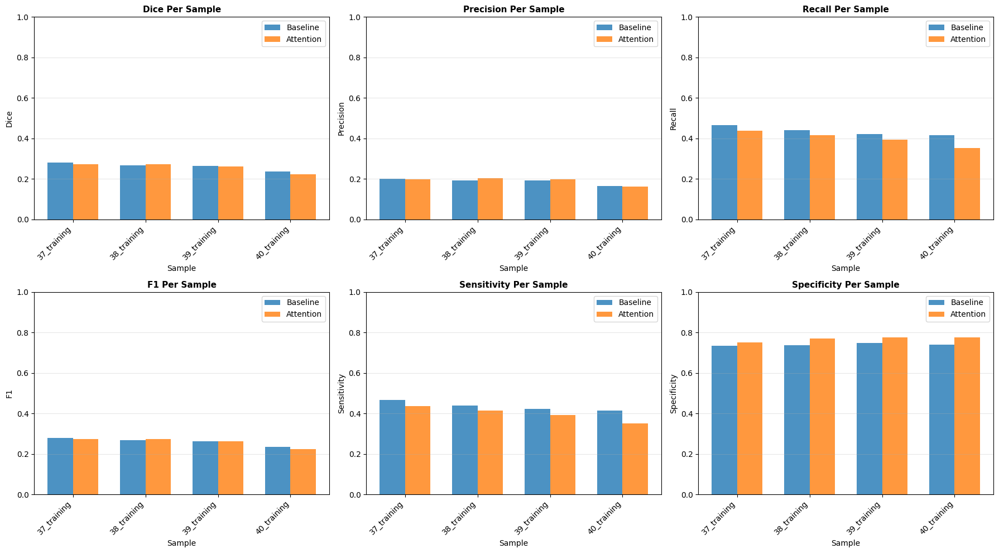

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

sample_names = [os.path.basename(p).split('.')[0] for p in test_image_paths]
metrics_to_plot = ['dice', 'precision', 'recall', 'f1', 'sensitivity', 'specificity']

for idx, metric in enumerate(metrics_to_plot):
    row = idx // 3
    col = idx % 3

    baseline_vals = [m[metric] for m in baseline_metrics]
    advanced_vals = [m[metric] for m in advanced_metrics]

    x = np.arange(len(sample_names))
    width = 0.35

    axes[row, col].bar(x - width/2, baseline_vals, width, label='Baseline', alpha=0.8)
    axes[row, col].bar(x + width/2, advanced_vals, width, label='Attention', alpha=0.8)
    axes[row, col].set_xlabel('Sample', fontsize=10)
    axes[row, col].set_ylabel(metric.capitalize(), fontsize=10)
    axes[row, col].set_title(f'{metric.capitalize()} Per Sample', fontsize=11, fontweight='bold')
    axes[row, col].set_xticks(x)
    axes[row, col].set_xticklabels(sample_names, rotation=45, ha='right')
    axes[row, col].legend()
    axes[row, col].grid(True, alpha=0.3, axis='y')
    axes[row, col].set_ylim([0, 1])

plt.tight_layout()
plt.savefig('drive_per_sample_metrics.png', dpi=150, bbox_inches='tight')
plt.show()

In [44]:
print("\n" + "="*60)
print("METRICS INTERPRETATION")
print("="*60)

print("\n1. DICE SCORE:")
print(f"   - Measures overlap between prediction and ground truth")
print(f"   - Baseline: {baseline_avg['dice']:.4f}, Attention: {advanced_avg['dice']:.4f}")
if advanced_avg['dice'] > baseline_avg['dice']:
    print(f"   ✓ Attention UNet shows {((advanced_avg['dice']/baseline_avg['dice']-1)*100):.2f}% improvement")
else:
    print(f"   ⚠ Baseline performs slightly better by {((baseline_avg['dice']/advanced_avg['dice']-1)*100):.2f}%")

print("\n2. PRECISION vs RECALL TRADE-OFF:")
print(f"   - Precision (Baseline): {baseline_avg['precision']:.4f}, (Attention): {advanced_avg['precision']:.4f}")
print(f"   - Recall (Baseline): {baseline_avg['recall']:.4f}, (Attention): {advanced_avg['recall']:.4f}")
if advanced_avg['precision'] > baseline_avg['precision']:
    print("   ✓ Attention UNet has fewer false positives (better precision)")
if advanced_avg['recall'] > baseline_avg['recall']:
    print("   ✓ Attention UNet detects more vessels (better recall)")

print("\n3. SENSITIVITY & SPECIFICITY:")
print(f"   - Sensitivity: Ability to detect vessels")
print(f"     Baseline: {baseline_avg['sensitivity']:.4f}, Attention: {advanced_avg['sensitivity']:.4f}")
print(f"   - Specificity: Ability to correctly identify non-vessels")
print(f"     Baseline: {baseline_avg['specificity']:.4f}, Attention: {advanced_avg['specificity']:.4f}")

print("\n4. ROC-AUC:")
print(f"   - Measures discrimination ability across all thresholds")
print(f"   - Baseline: {baseline_roc_auc:.4f}, Attention: {advanced_roc_auc:.4f}")
print(f"   - Closer to 1.0 is better (perfect = 1.0, random = 0.5)")

print("\n5. PR-AUC (Average Precision):")
print(f"   - More informative for imbalanced datasets (vessels are minority class)")
print(f"   - Baseline: {baseline_pr_auc:.4f}, Attention: {advanced_pr_auc:.4f}")
print(f"   - Better for evaluating clinical relevance")



METRICS INTERPRETATION

1. DICE SCORE:
   - Measures overlap between prediction and ground truth
   - Baseline: 0.2614, Attention: 0.2577
   ⚠ Baseline performs slightly better by 1.45%

2. PRECISION vs RECALL TRADE-OFF:
   - Precision (Baseline): 0.1868, (Attention): 0.1904
   - Recall (Baseline): 0.4359, (Attention): 0.3990
   ✓ Attention UNet has fewer false positives (better precision)

3. SENSITIVITY & SPECIFICITY:
   - Sensitivity: Ability to detect vessels
     Baseline: 0.4359, Attention: 0.3990
   - Specificity: Ability to correctly identify non-vessels
     Baseline: 0.7401, Attention: 0.7676

4. ROC-AUC:
   - Measures discrimination ability across all thresholds
   - Baseline: 0.6092, Attention: 0.6807
   - Closer to 1.0 is better (perfect = 1.0, random = 0.5)

5. PR-AUC (Average Precision):
   - More informative for imbalanced datasets (vessels are minority class)
   - Baseline: 0.1791, Attention: 0.1881
   - Better for evaluating clinical relevance


In [45]:
per_sample_data = {
    'Sample': sample_names,
    'Baseline_Dice': [m['dice'] for m in baseline_metrics],
    'Baseline_Precision': [m['precision'] for m in baseline_metrics],
    'Baseline_Recall': [m['recall'] for m in baseline_metrics],
    'Baseline_F1': [m['f1'] for m in baseline_metrics],
    'Advanced_Dice': [m['dice'] for m in advanced_metrics],
    'Advanced_Precision': [m['precision'] for m in advanced_metrics],
    'Advanced_Recall': [m['recall'] for m in advanced_metrics],
    'Advanced_F1': [m['f1'] for m in advanced_metrics],
}

df_per_sample = pd.DataFrame(per_sample_data)
df_per_sample.to_csv('drive_per_sample_metrics.csv', index=False)

In [46]:
print("📦 Installing Gradio...")
import subprocess
import sys
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "gradio"])

📦 Installing Gradio...


0

In [47]:
import gradio as gr
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from io import BytesIO

from monai.networks.nets import UNet, AttentionUnet
from monai.transforms import Compose, Resize, ScaleIntensity
from skimage import morphology, measure

print("✅ Libraries imported successfully")

✅ Libraries imported successfully


In [48]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️  Using device: {device}")


🖥️  Using device: cuda


In [49]:
print("🔄 Loading trained models...")

def load_models():
    """Load both trained models"""
    # Baseline model
    baseline_model = UNet(
        spatial_dims=2,
        in_channels=3,
        out_channels=1,
        channels=(16, 32, 64, 128, 256),
        strides=(2, 2, 2, 2),
        num_res_units=2,
    ).to(device)

    # Advanced model
    advanced_model = AttentionUnet(
        spatial_dims=2,
        in_channels=3,
        out_channels=1,
        channels=(16, 32, 64, 128, 256),
        strides=(2, 2, 2, 2),
    ).to(device)

    try:
        # Load weights
        baseline_checkpoint = torch.load('drive_baseline_unet_best.pth', map_location=device)
        baseline_model.load_state_dict(baseline_checkpoint['model_state_dict'])
        baseline_model.eval()
        print(f"✅ Baseline UNet loaded (Val Dice: {baseline_checkpoint['val_dice']:.4f})")

        advanced_checkpoint = torch.load('drive_attention_unet_best.pth', map_location=device)
        advanced_model.load_state_dict(advanced_checkpoint['model_state_dict'])
        advanced_model.eval()
        print(f"✅ Attention UNet loaded (Val Dice: {advanced_checkpoint['val_dice']:.4f})")

        return baseline_model, advanced_model
    except Exception as e:
        print(f"❌ Error loading models: {e}")
        return None, None

baseline_model, advanced_model = load_models()

🔄 Loading trained models...
✅ Baseline UNet loaded (Val Dice: 0.0000)
✅ Attention UNet loaded (Val Dice: 0.0000)


In [50]:
def preprocess_image(image):
    """Preprocess image for model inference"""
    # Convert PIL to numpy
    img_array = np.array(image)

    # Ensure RGB
    if len(img_array.shape) == 2:
        img_array = np.stack([img_array] * 3, axis=-1)
    elif img_array.shape[-1] == 4:
        img_array = img_array[:, :, :3]

    # Convert to tensor (C, H, W)
    if len(img_array.shape) == 3:
        img_array = np.transpose(img_array, (2, 0, 1))

    img_tensor = torch.from_numpy(img_array.astype(np.float32))

    # Apply transforms
    transforms = Compose([
        Resize(spatial_size=(512, 512)),
        ScaleIntensity(minv=0.0, maxv=1.0),
    ])

    img_tensor = transforms(img_tensor)
    img_tensor = img_tensor.unsqueeze(0).to(device)

    return img_tensor

In [51]:
def post_process_prediction(pred_binary):
    """Apply morphological post-processing"""
    # Morphological closing
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    closed = cv2.morphologyEx(pred_binary.astype(np.uint8), cv2.MORPH_CLOSE, kernel)

    # Remove small components
    labeled = measure.label(closed, connectivity=2)
    cleaned = morphology.remove_small_objects(labeled, min_size=50)

    return (cleaned > 0).astype(np.uint8)

In [52]:
def run_inference(model, image_tensor, threshold=0.5, apply_postprocessing=True):
    """Run inference on preprocessed image"""
    with torch.no_grad():
        output = model(image_tensor)
        prob = torch.sigmoid(output).cpu().numpy()[0, 0]
        pred_binary = (prob > threshold).astype(np.uint8)

        if apply_postprocessing:
            pred_binary = post_process_prediction(pred_binary)

        return prob, pred_binary

In [53]:
def create_overlay(original_image, prediction):
    """Create color overlay of prediction on original image"""
    # Resize original to 512x512
    original_resized = np.array(Image.fromarray(np.array(original_image)).resize((512, 512)))

    # Create overlay
    overlay = original_resized.copy()
    overlay[prediction > 0] = [255, 0, 0]  # Red for vessels

    # Blend
    blended = cv2.addWeighted(original_resized, 0.6, overlay, 0.4, 0)

    return blended

def create_comparison_image(prob_map, binary_pred, overlay):
    """Create side-by-side comparison"""
    # Create figure
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Probability map
    im = axes[0].imshow(prob_map, cmap='hot')
    axes[0].set_title('Probability Map', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    plt.colorbar(im, ax=axes[0], fraction=0.046)

    # Binary prediction
    axes[1].imshow(binary_pred, cmap='gray')
    axes[1].set_title('Binary Segmentation', fontsize=12, fontweight='bold')
    axes[1].axis('off')

    # Overlay
    axes[2].imshow(overlay)
    axes[2].set_title('Overlay on Original', fontsize=12, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()

    # Convert to image
    buf = BytesIO()
    plt.savefig(buf, format='png', dpi=150, bbox_inches='tight')
    buf.seek(0)
    img = Image.open(buf)
    plt.close(fig)

    return img


In [54]:
def predict(image, model_choice, threshold, apply_postprocessing):
    """Main function called by Gradio interface"""

    if image is None:
        return None, None, "Please upload an image first."

    if baseline_model is None or advanced_model is None:
        return None, None, "❌ Models not loaded. Please check model files."

    try:
        # Preprocess
        img_tensor = preprocess_image(image)

        # Select model
        if model_choice == "Baseline UNet":
            model = baseline_model
            model_name = "Baseline UNet"
        elif model_choice == "Attention UNet":
            model = advanced_model
            model_name = "Attention UNet"
        else:  # Compare Both
            # Run both models
            baseline_prob, baseline_pred = run_inference(
                baseline_model, img_tensor, threshold, apply_postprocessing
            )
            advanced_prob, advanced_pred = run_inference(
                advanced_model, img_tensor, threshold, apply_postprocessing
            )

            # Create comparison visualizations
            baseline_overlay = create_overlay(image, baseline_pred)
            advanced_overlay = create_overlay(image, advanced_pred)

            baseline_comp = create_comparison_image(baseline_prob, baseline_pred, baseline_overlay)
            advanced_comp = create_comparison_image(advanced_prob, advanced_pred, advanced_overlay)

            # Calculate metrics
            baseline_vessel_pct = (np.sum(baseline_pred) / baseline_pred.size) * 100
            advanced_vessel_pct = (np.sum(advanced_pred) / advanced_pred.size) * 100

            info_text = f"""
            ### 📊 Comparison Results

            **Baseline UNet:**
            - Vessel Coverage: {baseline_vessel_pct:.2f}%
            - Vessel Pixels: {np.sum(baseline_pred):,} / {baseline_pred.size:,}

            **Attention UNet:**
            - Vessel Coverage: {advanced_vessel_pct:.2f}%
            - Vessel Pixels: {np.sum(advanced_pred):,} / {advanced_pred.size:,}

            **Settings:**
            - Threshold: {threshold}
            - Post-processing: {'Enabled' if apply_postprocessing else 'Disabled'}
            """

            return baseline_comp, advanced_comp, info_text

        # Single model inference
        prob, pred = run_inference(model, img_tensor, threshold, apply_postprocessing)

        # Create visualization
        overlay = create_overlay(image, pred)
        comparison = create_comparison_image(prob, pred, overlay)

        # Calculate metrics
        vessel_pixels = np.sum(pred)
        total_pixels = pred.size
        vessel_pct = (vessel_pixels / total_pixels) * 100

        info_text = f"""
        ### 📊 Segmentation Results ({model_name})

        **Metrics:**
        - Vessel Coverage: {vessel_pct:.2f}%
        - Vessel Pixels: {vessel_pixels:,}
        - Total Pixels: {total_pixels:,}
        - Background Pixels: {total_pixels - vessel_pixels:,}

        **Settings:**
        - Model: {model_name}
        - Threshold: {threshold}
        - Post-processing: {'Enabled' if apply_postprocessing else 'Disabled'}

        **Color Code:**
        - 🔴 Red = Detected vessels
        - 🟡 Hot colors = High probability
        - 🔵 Cool colors = Low probability
        """

        return comparison, None, info_text

    except Exception as e:
        error_msg = f"❌ Error during prediction: {str(e)}"
        print(error_msg)
        return None, None, error_msg

In [55]:
print("🎨 Building Gradio interface...")

# Custom CSS for better styling
custom_css = """
.gradio-container {
    font-family: 'Arial', sans-serif;
}
.gr-button-primary {
    background: linear-gradient(90deg, #4CAF50 0%, #45a049 100%) !important;
}
footer {
    display: none !important;
}
"""

# Create interface
with gr.Blocks(css=custom_css, theme=gr.themes.Soft(), title="DRIVE Vessel Segmentation") as demo:

    # Header
    gr.Markdown("""
    # 🏥 DRIVE Retinal Vessel Segmentation
    ### Automated vessel detection using Deep Learning (UNet & Attention UNet)

    Upload a fundus image to segment retinal blood vessels. Compare baseline and advanced models side-by-side!
    """)

    with gr.Row():
        with gr.Column(scale=1):
            # Input section
            gr.Markdown("### 📤 Input")
            input_image = gr.Image(
                label="Upload Fundus Image",
                type="pil",
                height=300
            )

            gr.Markdown("### ⚙️ Settings")
            model_selector = gr.Radio(
                choices=["Baseline UNet", "Attention UNet", "Compare Both"],
                value="Compare Both",
                label="Model Selection",
                info="Choose which model to use for segmentation"
            )

            threshold_slider = gr.Slider(
                minimum=0.0,
                maximum=1.0,
                value=0.5,
                step=0.05,
                label="Threshold",
                info="Adjust sensitivity for vessel detection"
            )

            postprocess_checkbox = gr.Checkbox(
                value=True,
                label="Apply Post-Processing",
                info="Enable morphological operations to clean predictions"
            )

            predict_btn = gr.Button("🚀 Run Segmentation", variant="primary", size="lg")

            gr.Markdown("""
            ### 📖 Quick Guide
            1. Upload a retinal fundus image
            2. Select model (or compare both)
            3. Adjust threshold if needed
            4. Click 'Run Segmentation'
            """)

        with gr.Column(scale=2):
            # Output section
            gr.Markdown("### 📊 Results")

            with gr.Row():
                output_image1 = gr.Image(
                    label="Result 1",
                    height=400
                )
                output_image2 = gr.Image(
                    label="Result 2 (Comparison Mode Only)",
                    height=400,
                    visible=True
                )

            info_box = gr.Markdown(
                value="Upload an image and click 'Run Segmentation' to see results.",
                label="Information"
            )

    # Example images section
    gr.Markdown("---")
    gr.Markdown("### 🖼️ Example Images")
    gr.Markdown("Click on any example image below to load it:")

    # Try to load example images from the dataset
    try:
        from glob import glob
        example_paths = sorted(glob("drive_data/DRIVE/training/images/*.tif"))[:3]
        if example_paths:
            gr.Examples(
                examples=example_paths,
                inputs=input_image,
                label="Sample Fundus Images"
            )
    except:
        gr.Markdown("*Load your own images from the DRIVE dataset*")

    # Footer
    gr.Markdown("""
    ---
    <div style='text-align: center; color: #666;'>
        <p>🏥 Built with MONAI & Gradio | DRIVE Dataset Segmentation Challenge</p>
        <p>Models: UNet (Baseline) & Attention UNet (Advanced)</p>
    </div>
    """)

    # Connect button to function
    predict_btn.click(
        fn=predict,
        inputs=[input_image, model_selector, threshold_slider, postprocess_checkbox],
        outputs=[output_image1, output_image2, info_box]
    )


🎨 Building Gradio interface...


In [ ]:
print("\n" + "="*60)
print("🚀 LAUNCHING GRADIO APP")
print("="*60)

# Launch with share=True to get public URL
demo.launch(
    share=True,  # Creates public URL automatically!
    debug=True,
    show_error=True
)

print("\n✅ App is running!")
print("📱 Use the public URL above to access from anywhere!")
print("⚠️ Keep this cell running. Don't interrupt it.")


🚀 LAUNCHING GRADIO APP
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://10e0e29379a64681ec.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
